In [1]:
# Feel free to add dependencies, but make sure that they are included in environment.yml

#disable some annoying warnings
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

#plots the figures in place instead of a new window
%matplotlib inline

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import altair as alt
from altair import datum
alt.data_transformers.disable_max_rows()

from sklearn import manifold
from openTSNE import TSNE
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ParameterGrid
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

C:\Users\jpetr\anaconda3\envs\xai_proj_space\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<h1>Read excel file</h1>

In [2]:
# Install this to be able to use pd.read_excel
# pip install openpyxl

In [3]:
# Load dataset
data = pd.read_excel('merged_games_with_scores_final_new.xlsx')

In [4]:
# Selecting only the board state columns for dimensionality reduction
board_state_columns = data.loc[:, 'aa':'ss']

info_cols=[col for col in data.columns if col not in board_state_columns]

In [5]:
info_cols

['game_id',
 'move_id',
 'color',
 'winner_color',
 'winner_score',
 'result',
 'rules',
 'handicap',
 'starter_player',
 'step_count',
 'level',
 'Rank',
 'Player',
 'Date',
 'Our_players_colour',
 'Area score',
 'Area score of opponent',
 'Area_winner_color',
 'Area_result',
 'Territory_score',
 'Territory_score_of_opponent',
 'Territory_winner_color',
 'Territory_result']

In [6]:
# Selecting only the board state columns for dimensionality reduction
board_state_columns = data.loc[:, 'aa':'ss']

# player_info_columns for merged_games_with_scores_final.xlsx
player_info_columns = data[info_cols]

In [7]:
data.Player

0       FrayedKnot
1       FrayedKnot
2       FrayedKnot
3       FrayedKnot
4       FrayedKnot
           ...    
9750          tmat
9751          tmat
9752          tmat
9753          tmat
9754          tmat
Name: Player, Length: 9755, dtype: object

In [8]:
board_state_columns

,aa,ab,ac,ad,ae,af,ag,ah,ai,aj,...,sj,sk,sl,sm,sn,so,sp,sq,sr,ss
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9751,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9752,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9753,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Date,Our_players_colour,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result
0,1,1,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
1,1,2,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
2,1,3,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
3,1,4,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
4,1,5,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"


<h1>PCA</h1> 

<h5>PCA for the board state columns</h5>

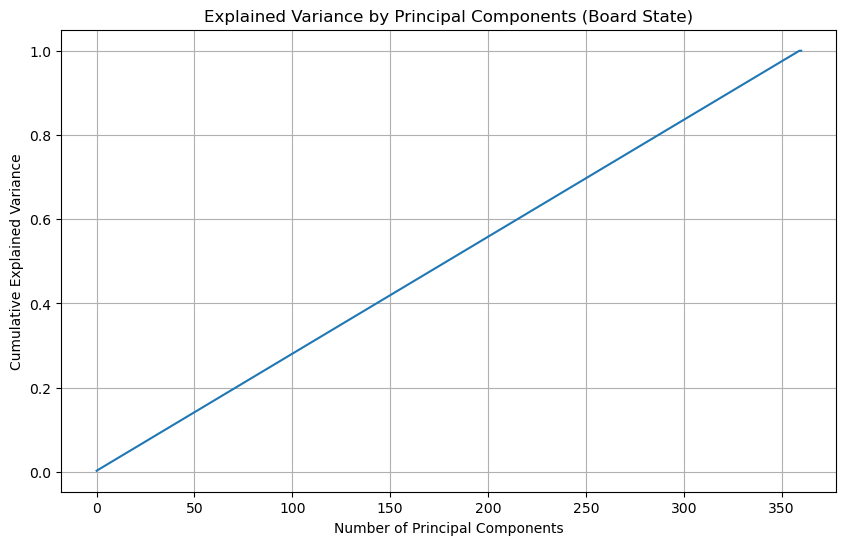

Explained variance by each component: [0.00278106 0.00278098 0.00278027 0.00277979 0.00277972 0.00277971
 0.00277958 0.00277955 0.00277954 0.00277947 0.00277943 0.00277942
 0.00277935 0.00277931 0.00277928 0.00277927 0.00277925 0.00277924
 0.00277922 0.0027792  0.00277911 0.00277907 0.00277907 0.00277904
 0.00277901 0.002779   0.00277899 0.00277898 0.00277895 0.00277894
 0.00277892 0.00277891 0.00277888 0.00277888 0.00277887 0.00277884
 0.00277884 0.00277883 0.0027788  0.0027788  0.0027788  0.00277879
 0.00277878 0.00277877 0.00277876 0.00277874 0.00277874 0.00277874
 0.00277873 0.00277872 0.00277871 0.0027787  0.00277869 0.00277869
 0.00277864 0.00277859 0.00277856 0.00277856 0.00277854 0.00277845
 0.00277845 0.00277844 0.00277844 0.00277843 0.0027784  0.00277836
 0.00277836 0.00277836 0.00277835 0.00277832 0.00277832 0.00277832
 0.00277832 0.0027783  0.00277829 0.00277829 0.00277827 0.00277825
 0.00277822 0.00277821 0.0027782  0.00277819 0.00277817 0.00277816
 0.00277813 0.00277813 0

In [10]:
# Standardize the board state data
scaler = StandardScaler()
board_state_scaled = scaler.fit_transform(board_state_columns)

# Apply PCA to the board state columns
pca = PCA()
board_state_pca = pca.fit_transform(board_state_scaled)

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components (Board State)')
plt.grid(True)
plt.show()

# Checking how many components explain a significant amount of variance
explained_variance = pca.explained_variance_ratio_

# Summary of PCA
print(f"Explained variance by each component: {explained_variance}")
print(f"Total explained variance: {np.cumsum(explained_variance)}")


<h6>It doesn't make any sense to use PCA on the board states, as no feature (in this case board position) seems to be more important than the others.</h6>

<h5>PCA for the player info columns</h5>

In [11]:
# !!!! winner_score and Rank are excluded here!!!!
# feature names in merged_games_with_scores_final_new.xlsx
numerical_features = ['handicap', 'step_count', 
                      'Area score', 'Area score of opponent', 'Area_result', 'Territory_score', 
                      'Territory_score_of_opponent', 'Territory_result']
categorical_features = ['game_id', 'move_id', 'color', 
                        'winner_color', 'result', 'rules', 'starter_player', 
                        'level', 'Player', 'Our_players_colour', 'Area_winner_color', 'Territory_winner_color']

# Converting numerical features to numeric (int/float)
for feature in numerical_features:
    player_info_columns[feature] = pd.to_numeric(player_info_columns[feature], errors='coerce')

# Handling any NaN values that result from conversion
# For example, filling NaN values with the mean of the column
player_info_columns[numerical_features] = player_info_columns[numerical_features].fillna(
    player_info_columns[numerical_features].mean()
)

C:\Users\jpetr\AppData\Local\Temp\ipykernel_9788\578163067.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_info_columns[feature] = pd.to_numeric(player_info_columns[feature], errors='coerce')
C:\Users\jpetr\AppData\Local\Temp\ipykernel_9788\578163067.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_info_columns[numerical_features] = player_info_columns[numerical_features].fillna(


In [12]:
numerical_features

['handicap',
 'step_count',
 'Area score',
 'Area score of opponent',
 'Area_result',
 'Territory_score',
 'Territory_score_of_opponent',
 'Territory_result']

In [13]:
# Preprocessing: One-Hot Encoding for categorical features and Standardization for numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)

# Create a pipeline for PCA
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', PCA())
])

# Apply PCA to the player info columns
player_info_pca = pipeline.fit_transform(player_info_columns)

# Extract PCA component and explained variance
pca = pipeline.named_steps['pca']
explained_variance = pca.explained_variance_ratio_

# Get feature names from the preprocessor
# Note: OneHotEncoder generates multiple columns for each category, so we need to extract all feature names
onehot_feature_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
all_feature_names = numerical_features + list(onehot_feature_names)

# Analyze the PCA components to see the most important features
pca_components = pca.components_

# Print out the most important features for each principal component
print("\nMost important features for each principal component:\n")
for i, component in enumerate(pca_components):
    # Get the top features for this component, sorted by the absolute value of their loadings
    important_features = sorted(zip(all_feature_names, component), key=lambda x: abs(x[1]), reverse=True)
    print(f"Principal Component {i + 1}:")
    for feature, loading in important_features[:10]:  # Print top 10 features for each component
        print(f"  {feature}: {loading:.4f}")
    print()



Most important features for each principal component:

Principal Component 1:
  Territory_score_of_opponent: 0.4368
  Area score of opponent: 0.4179
  Area score: -0.4079
  Territory_result: 0.3632
  Area_result: 0.3628
  Territory_score: -0.3218
  level_1: 0.1539
  step_count: 0.1083
  level_3: -0.0993
  winner_color_white: -0.0784

Principal Component 2:
  handicap: 0.4796
  Territory_score: -0.4090
  Territory_result: -0.4058
  Area_result: -0.4036
  Area score: -0.3122
  Area score of opponent: 0.1736
  starter_player_black: -0.1335
  starter_player_white: 0.1335
  result_score: -0.1215
  result_resign: 0.1215

Principal Component 3:
  step_count: 0.6448
  Area score of opponent: 0.2564
  Area_winner_color_B: -0.2239
  Area_winner_color_W: 0.2239
  Territory_winner_color_B: -0.2060
  Territory_winner_color_W: 0.2060
  starter_player_white: -0.1937
  starter_player_black: 0.1937
  rules_Japanese: -0.1803
  Player_mangochia: 0.1795

Principal Component 4:
  handicap: 0.5985
  starte

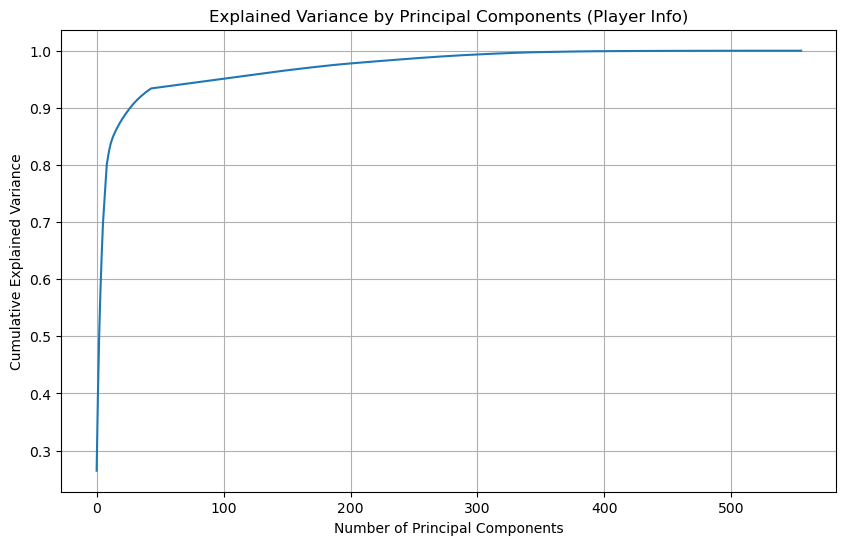

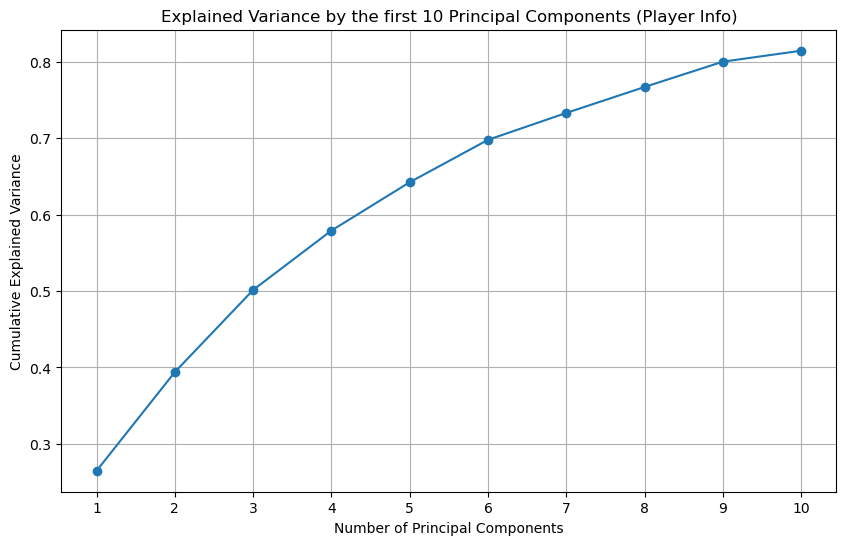

In [14]:
# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components (Player Info)')
plt.grid(True)
plt.show()

# Plot the same explained variance ratio plot as before but only displaying the first 10 principal components
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance)[:10], marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by the first 10 Principal Components (Player Info)')
plt.xticks(ticks=range(10), labels=range(1, 10 + 1))  
plt.grid(True)
plt.show()

<h5>PCA for every feature (both player info columns and board states)</h5>

In [15]:
all_data = pd.concat([player_info_columns, board_state_columns], axis=1)

In [16]:
all_data

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,sj,sk,sl,sm,sn,so,sp,sq,sr,ss
0,1,1,white,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
1,1,2,black,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
2,1,3,white,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
3,1,4,black,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
4,1,5,white,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0


In [17]:
numerical_features.extend(board_state_columns.columns)

In [18]:
# Preprocessing: One-Hot Encoding for categorical features and Standardization for numerical features

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)

# Create a pipeline for PCA
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', PCA())
])

# Apply PCA to the player info columns
all_data_pca = pipeline.fit_transform(all_data)

# Extract PCA component and explained variance
pca = pipeline.named_steps['pca']
explained_variance = pca.explained_variance_ratio_

# Get feature names from the preprocessor
# Note: OneHotEncoder generates multiple columns for each category, so we need to extract all feature names
onehot_feature_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
all_feature_names = numerical_features + list(onehot_feature_names)

# Analyze the PCA components to see the most important features
pca_components = pca.components_

# Print out the most important features for each principal component
print("\nMost important features for each principal component:\n")
for i, component in enumerate(pca_components):
    # Get the top features for this component, sorted by the absolute value of their loadings
    important_features = sorted(zip(all_feature_names, component), key=lambda x: abs(x[1]), reverse=True)
    print(f"Principal Component {i + 1}:")
    for feature, loading in important_features[:10]:  # Print top 10 features for each component
        print(f"  {feature}: {loading:.4f}")
    print()


Most important features for each principal component:

Principal Component 1:
  Territory_score_of_opponent: 0.4352
  Area score of opponent: 0.4163
  Area score: -0.4071
  Territory_result: 0.3611
  Area_result: 0.3607
  Territory_score: -0.3214
  level_1: 0.1535
  step_count: 0.1069
  level_3: -0.0992
  winner_color_black: 0.0780

Principal Component 2:
  handicap: 0.4760
  Territory_score: -0.3995
  Territory_result: -0.3978
  Area_result: -0.3957
  Area score: -0.3050
  Area score of opponent: 0.1660
  starter_player_white: 0.1346
  starter_player_black: -0.1346
  result_resign: 0.1192
  result_score: -0.1192

Principal Component 3:
  step_count: 0.6217
  Area score of opponent: 0.2453
  Area_winner_color_W: 0.2103
  Area_winner_color_B: -0.2103
  Territory_winner_color_W: 0.1943
  Territory_winner_color_B: -0.1943
  starter_player_black: 0.1703
  starter_player_white: -0.1703
  Player_mangochia: 0.1702
  rules_Japanese: -0.1672

Principal Component 4:
  handicap: 0.5060
  starter

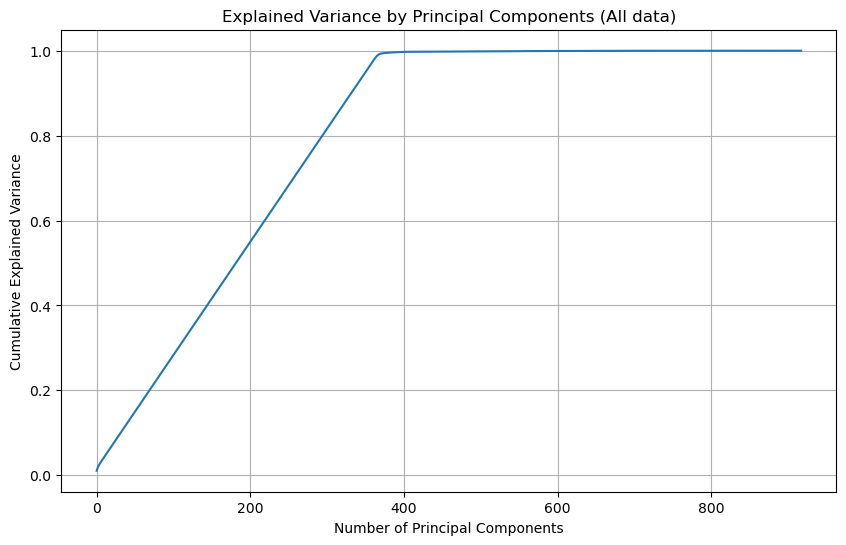

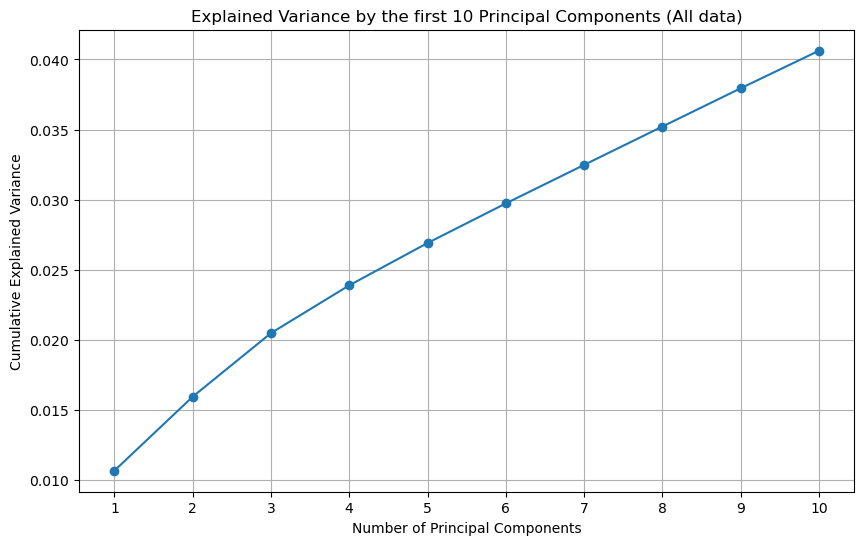

In [19]:
# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components (All data)')
plt.grid(True)
plt.show()

# Plot the same explained variance ratio plot as before but only displaying the first 10 principal components
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance)[:10], marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by the first 10 Principal Components (All data)')
plt.xticks(ticks=range(10), labels=range(1, 10 + 1))  
plt.grid(True)
plt.show()

<h3> Brief insights from PCA for all_data (this includes all features)</h3>

**Principal Component 1:**  It mainly deals with the differences in territory and area scores, showing how these scores influence the game's outcome and overall control of the board.

**Principal Component 2:** It focuses on the effect of game handicaps and the final scores, highlighting how initial advantages or disadvantages impact the result.

**Principal Component 3:** It is all about the number of moves and how the game's progression ties into scoring patterns, with some emphasis on the order of players and rules used.

**Principal Component 4:** It captures the role of handicaps and which player starts, showing how these aspects shape the game’s balance and scoring.

**Principal Component 5:** It looks at how certain player attributes and winning conditions influence the outcome, especially the role of player color and related strategies.

# USE this pca_df for state links

Length of pca_index: 9755
Length of player_info_pca: 9755
Checks begin here...
[1 2 3]
level
2    5677
1    2434
3    1644
Name: count, dtype: int64
[1 2 3]
Checks end here.


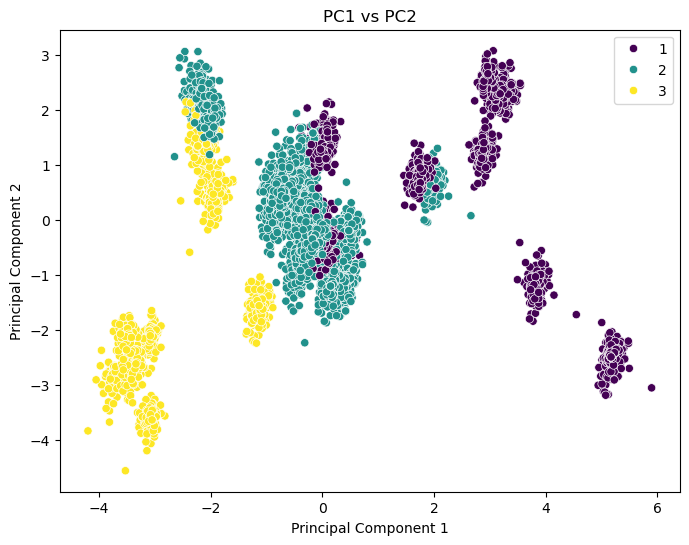

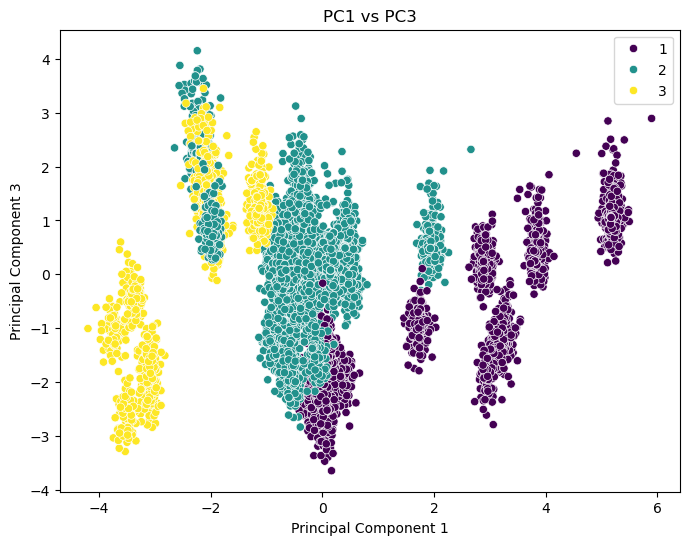

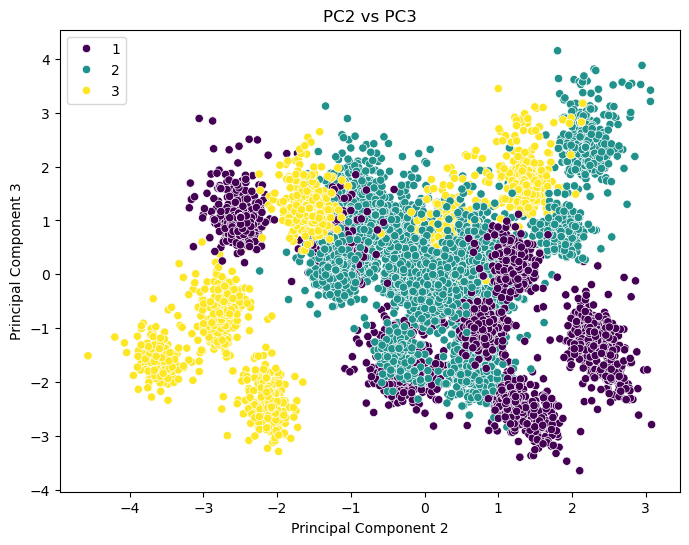

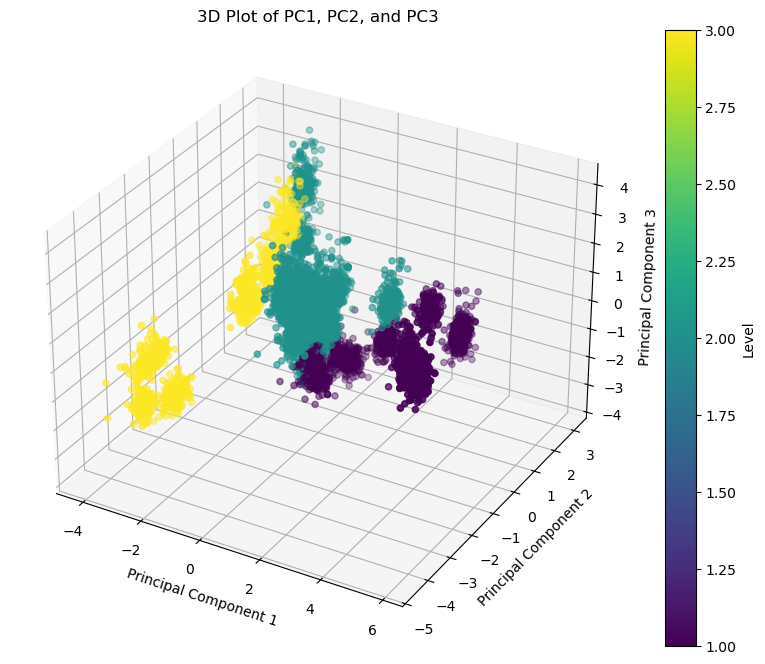

In [152]:
# pca_index corresponds to the entire index of player_info_columns
pca_index = player_info_columns.index

# Check if lengths match
print("Length of pca_index:", len(pca_index))
print("Length of player_info_pca:", len(player_info_pca))

# X_pca_first_3 = pca_components[:, :3]  # Keep only the first 3 columns

# Create a DataFrame for easy handling of PCA components
# pca_df = pd.DataFrame(X_pca_first_3, columns=['PC1', 'PC2', 'PC3'])

# Print pca_df
# print(pca_df)

# Optionally, you can add labels or use some feature for coloring
# For example, using 'winner_color' for coloring (if it's a binary/categorical feature)
# pca_df['level'] = player_info_columns['level'].values  # Adjust to your chosen categorical feature

# Create the pca_df DataFrame using the first 3 principal components
pca_df = pd.DataFrame(player_info_pca[:, :3], columns=['PC1', 'PC2', 'PC3'])

# Use pca_index to get the correct 'level' values from player_info_columns
pca_df['level'] = player_info_columns.loc[pca_index, 'level'].values

# JUST SOME CHECKS
print("Checks begin here...")
print(player_info_columns['level'].unique())
print(player_info_columns['level'].value_counts())
print(pca_df['level'].unique())
print("Checks end here.")

# Plotting PC1 vs PC2
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='level', palette='viridis')
plt.title('PC1 vs PC2')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

# Plotting PC1 vs PC3
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC3', hue='level', palette='viridis')
plt.title('PC1 vs PC3')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend()
plt.show()

# Plotting PC2 vs PC3
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC2', y='PC3', hue='level', palette='viridis')
plt.title('PC2 vs PC3')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend()
plt.show()

# 3D Plot of PC1, PC2, and PC3
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(pca_df['PC1'], pca_df['PC2'], pca_df['PC3'], c=pca_df['level'], cmap='viridis')
ax.set_title('3D Plot of PC1, PC2, and PC3')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.colorbar(sc, label='Level')
plt.show()

# KEEP ALL

In [153]:
import plotly.express as px

fig = px.scatter_3d(pca_df, x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
              color=pca_df['level'])
fig.show()

# KEEP ALL above 3d

<h3> Meta Data Encoding for PCA</h3>

# use this for LINK STATES

In [155]:
pca_df

,PC1,PC2,PC3,level
0,-0.310917,1.107409,-2.521878,1
1,-0.257466,0.985123,-2.905615,1
2,-0.197816,0.947744,-2.319958,1
3,-0.200465,1.542906,-3.011593,1
4,-0.236050,1.155984,-2.253224,1
...,...,...,...,...
9750,2.955753,2.788234,-1.560768,1
9751,2.878121,2.428094,-1.685162,1
9752,2.894475,2.524506,-1.924709,1
9753,2.959663,2.639010,-1.893251,1


In [ ]:
pca_df

In [159]:
fig = px.scatter_3d(pca_df, x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
              color=pca_df['result'])
fig.show()

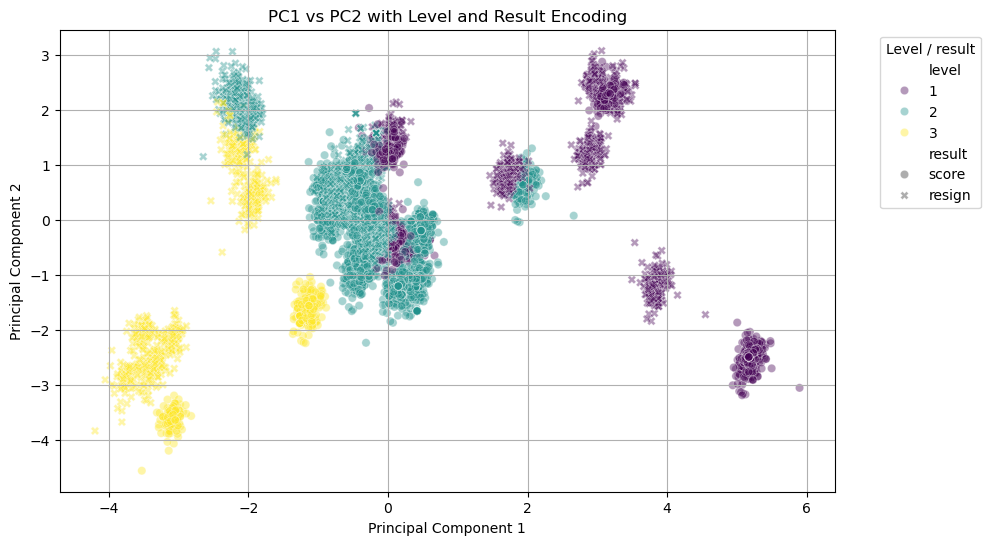

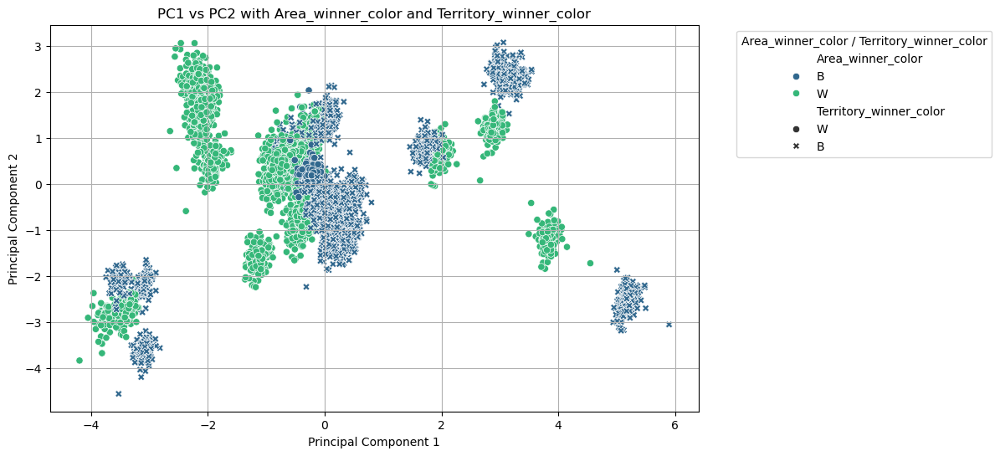

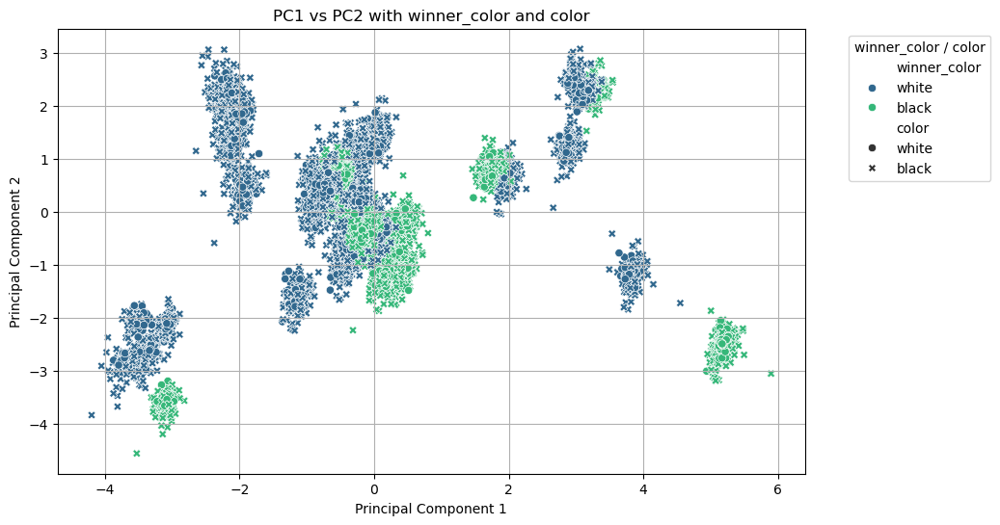

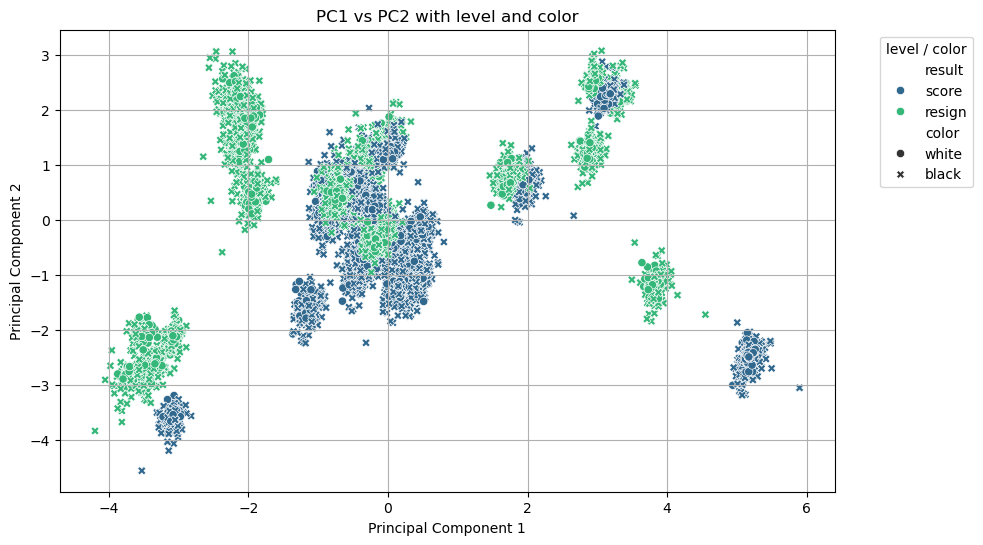

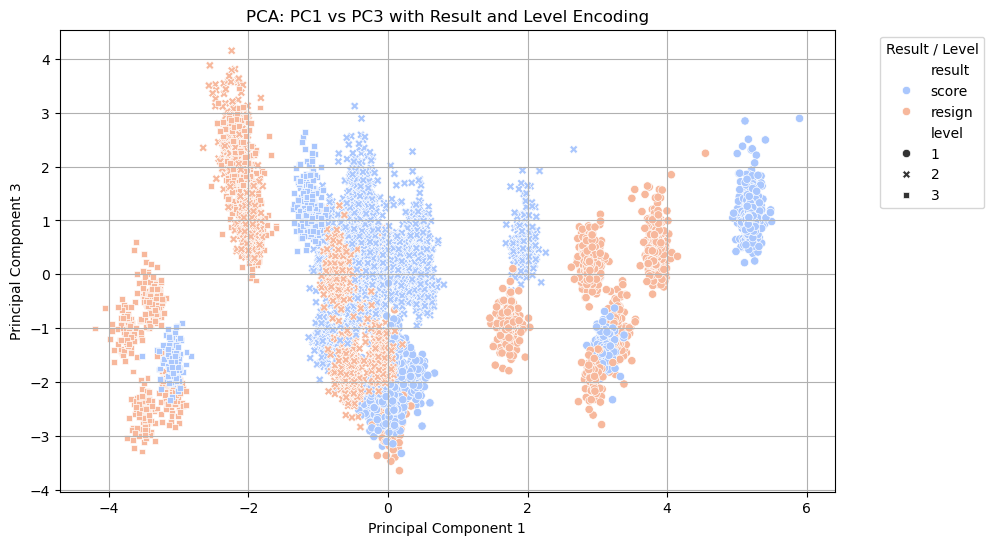

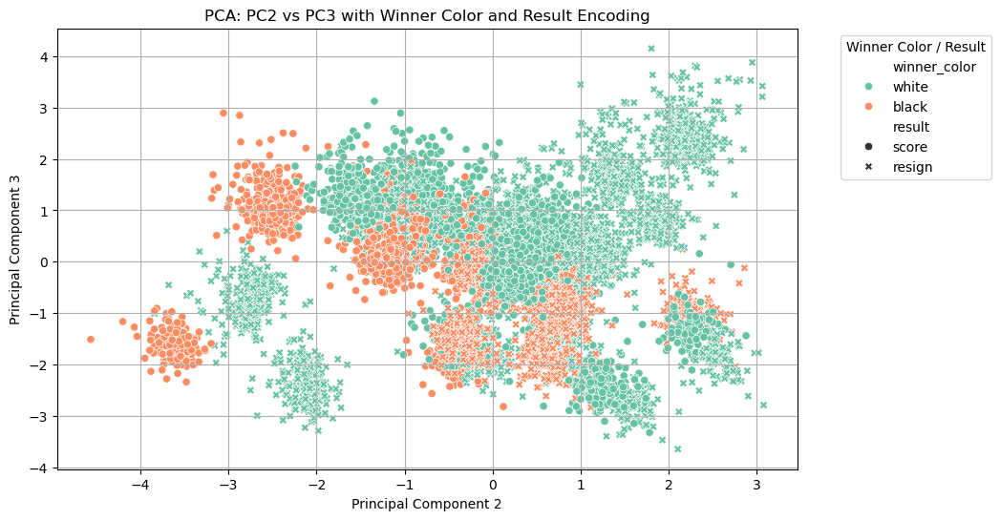

In [157]:
# 1. PCA Implementation
# ---------------------------------
"""pca = PCA(n_components=3)  # We are interested in the first 3 components
pca_components = pca.fit_transform(player_info_columns[numerical_features])

# Create a DataFrame for easy handling of PCA components
pca_df = pd.DataFrame(pca_components, columns=['PC1', 'PC2', 'PC3'])"""


# Optionally, add meta-data features for encoding
pca_df['level'] = player_info_columns['level'].values
pca_df['winner_color'] = player_info_columns['winner_color'].values
pca_df['result'] = player_info_columns['result'].values
pca_df['starter_player'] = player_info_columns['starter_player'].values
pca_df['Area_winner_color'] = player_info_columns['Area_winner_color'].values
pca_df['Territory_winner_color'] = player_info_columns['Territory_winner_color'].values
pca_df['color'] = player_info_columns['color'].values

# ---------------------------------
# 2. PCA Plots with Meta-Data Encoding
# ---------------------------------
# PC1 vs PC2
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='level', style='result', palette='viridis', alpha=0.4)
plt.title('PC1 vs PC2 with Level and Result Encoding')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Level / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Area_winner_color', style='Territory_winner_color', palette='viridis')
plt.title('PC1 vs PC2 with Area_winner_color and Territory_winner_color')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Area_winner_color / Territory_winner_color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='winner_color', style='color', palette='viridis')
plt.title('PC1 vs PC2 with winner_color and color')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='winner_color / color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='result', style='color', palette='viridis')
plt.title('PC1 vs PC2 with level and color')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='level / color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# PC1 vs PC3
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC3', hue='result', style='level', palette='coolwarm')
plt.title('PCA: PC1 vs PC3 with Result and Level Encoding')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(title='Result / Level', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# PC2 vs PC3
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC2', y='PC3', hue='winner_color', style='result', palette='Set2')
plt.title('PCA: PC2 vs PC3 with Winner Color and Result Encoding')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(title='Winner Color / Result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

KEEP

# Additional column

In [18]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,level,Rank,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result
0,1,1,white,white,Time,score,Japanese,4,white,105,1,53,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
1,1,2,black,white,Time,score,Japanese,4,white,105,1,53,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
2,1,3,white,white,Time,score,Japanese,4,white,105,1,53,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
3,1,4,black,white,Time,score,Japanese,4,white,105,1,53,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
4,1,5,white,white,Time,score,Japanese,4,white,105,1,53,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,1,38,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,1,38,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,1,38,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,1,38,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408


# here is the code which makes the additional column, which you will need for the link states line coloring

# 3. Link states

In [187]:
def determine_phase(df):
    # Group by game_id
    df['phase'] = df.groupby('game_id')['move_id'].transform(
        lambda x: ["starter" if step <= 20 
                   else "final" if step > (x.max() - 20) 
                   else "intermediate"
                   for step in x]
    )
    return df

# Apply the function to the DataFrame
player_info_columns = determine_phase(player_info_columns)

C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_14212\1667704383.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [189]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result,Player,phase
0,1,1,white,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,FrayedKnot,starter
1,1,2,black,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,FrayedKnot,starter
2,1,3,white,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,FrayedKnot,starter
3,1,4,black,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,FrayedKnot,starter
4,1,5,white,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,FrayedKnot,starter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,tmat,final
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,tmat,final
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,tmat,final
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,tmat,final


In [190]:
pca_df

,PC1,PC2,PC3,level,winner_color,result,starter_player,Area_winner_color,Territory_winner_color,color
0,-0.310917,1.107409,-2.521878,1,white,score,white,B,W,white
1,-0.257466,0.985123,-2.905615,1,white,score,white,B,W,black
2,-0.197816,0.947744,-2.319958,1,white,score,white,B,W,white
3,-0.200465,1.542906,-3.011593,1,white,score,white,B,W,black
4,-0.236050,1.155984,-2.253224,1,white,score,white,B,W,white
...,...,...,...,...,...,...,...,...,...,...
9750,2.955753,2.788234,-1.560768,1,white,resign,white,B,B,black
9751,2.878121,2.428094,-1.685162,1,white,resign,white,B,B,white
9752,2.894475,2.524506,-1.924709,1,white,resign,white,B,B,black
9753,2.959663,2.639010,-1.893251,1,white,resign,white,B,B,white


# Liza's stuff below there

In [173]:
def visualise_clusters(labels = None, cmap = 'viridis'):
    plt.figure(figsize = (21, 3))
    plt.scatter(*X_tsne[:, :2].T, s = 10, c = labels, cmap = cmap)
    plt.show()

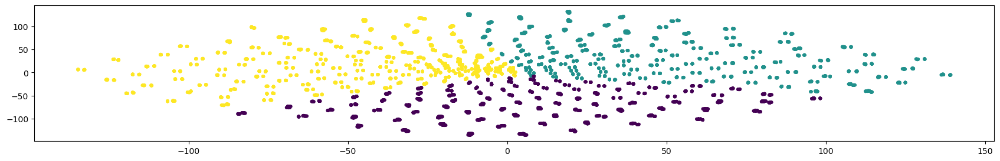

In [174]:
from sklearn.cluster import KMeans, DBSCAN

k_means_clusters = KMeans(n_clusters = 3).fit_predict(X_embedded)
visualise_clusters(k_means_clusters)

In [175]:
fig = px.scatter_3d(X_tsne, x=X_tsne[:, 0], y=X_tsne[:, 1], z=X_tsne[:, 2],
              color=data['level'])
fig.show()

IndexError: index 2 is out of bounds for axis 1 with size 2

In [29]:
fig = px.scatter_3d(X_tsne, x=X_tsne[:, 0], y=X_tsne[:, 1], z=X_tsne[:, 2],
              color=player_info_columns['phase'])
fig.show()

In [129]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

#Source: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html


def silhouette(X, y, range_n_clusters, seed = 0):
  for n_clusters in range_n_clusters:
      # Create a subplot with 1 row and 2 columns
      fig, (ax1, ax2) = plt.subplots(1, 2)
      fig.set_size_inches(18, 7)

      # The 1st subplot is the silhouette plot
      # The silhouette coefficient can range from -1, 1 but in this example all
      # lie within [-0.1, 1]
      ax1.set_xlim([-0.1, 1])
      # The (n_clusters+1)*10 is for inserting blank space between silhouette
      # plots of individual clusters, to demarcate them clearly.
      ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

      # Initialize the clusterer with n_clusters value and a random generator
      # seed of 10 for reproducibility.
      clusterer = KMeans(n_clusters=n_clusters, random_state=seed)
      cluster_labels = clusterer.fit_predict(X)

      # The silhouette_score gives the average value for all the samples.
      # This gives a perspective into the density and separation of the formed
      # clusters
      silhouette_avg = silhouette_score(X, cluster_labels)
      print(
          "For n_clusters =",
          n_clusters,
          "The average silhouette_score is :",
          silhouette_avg,
      )

      # Compute the silhouette scores for each sample
      sample_silhouette_values = silhouette_samples(X, cluster_labels)

      y_lower = 10
      for i in range(n_clusters):
          # Aggregate the silhouette scores for samples belonging to
          # cluster i, and sort them
          ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

          ith_cluster_silhouette_values.sort()

          size_cluster_i = ith_cluster_silhouette_values.shape[0]
          y_upper = y_lower + size_cluster_i

          color = cm.nipy_spectral(float(i) / n_clusters)
          ax1.fill_betweenx(
              np.arange(y_lower, y_upper),
              0,
              ith_cluster_silhouette_values,
              facecolor=color,
              edgecolor=color,
              alpha=0.7,
          )

          # Label the silhouette plots with their cluster numbers at the middle
          ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

          # Compute the new y_lower for next plot
          y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

      # 2nd Plot showing the actual clusters formed
      colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
      ax2.scatter(
          X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
      )

      # Labeling the clusters
      centers = clusterer.cluster_centers_
      # Draw white circles at cluster centers
      ax2.scatter(
          centers[:, 0],
          centers[:, 1],
          marker="o",
          c="white",
          alpha=1,
          s=200,
          edgecolor="k",
      )

      for i, c in enumerate(centers):
          ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

      ax2.set_title("The visualization of the clustered data.")
      ax2.set_xlabel("Feature space for the 1st feature")
      ax2.set_ylabel("Feature space for the 2nd feature")

      plt.suptitle(
          "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
          % n_clusters,
          fontsize=14,
          fontweight="bold",
      )

  plt.show()

For n_clusters = 2 The average silhouette_score is : 0.33455145
For n_clusters = 3 The average silhouette_score is : 0.36776647
For n_clusters = 4 The average silhouette_score is : 0.3592546
For n_clusters = 5 The average silhouette_score is : 0.34249908
For n_clusters = 6 The average silhouette_score is : 0.3322676
For n_clusters = 7 The average silhouette_score is : 0.32759625
For n_clusters = 8 The average silhouette_score is : 0.34398985
For n_clusters = 9 The average silhouette_score is : 0.3573773
For n_clusters = 10 The average silhouette_score is : 0.34457237


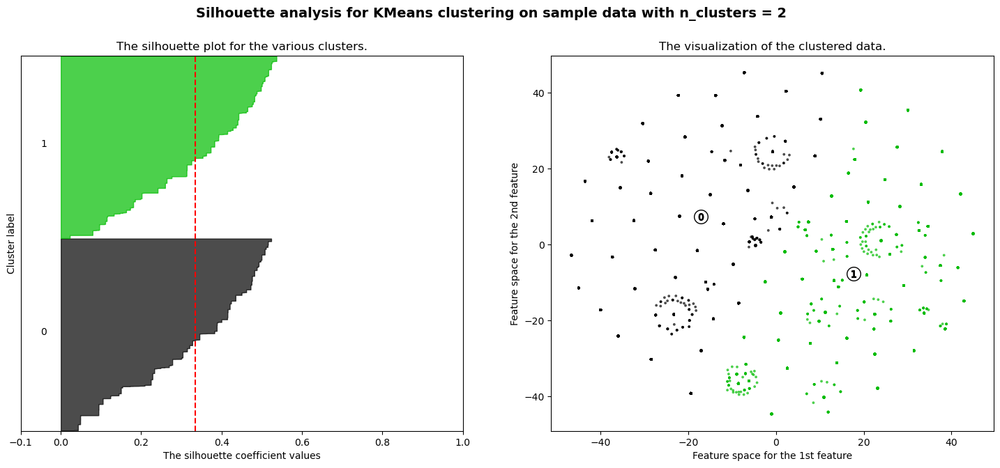

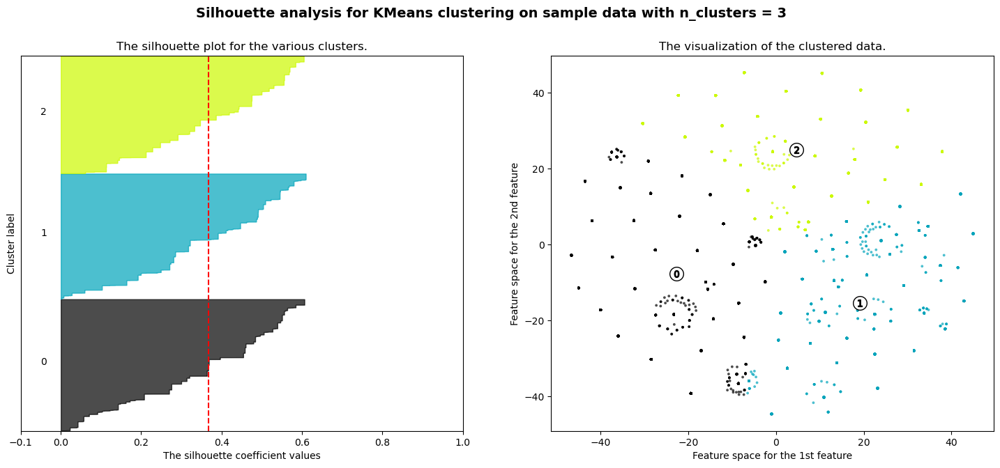

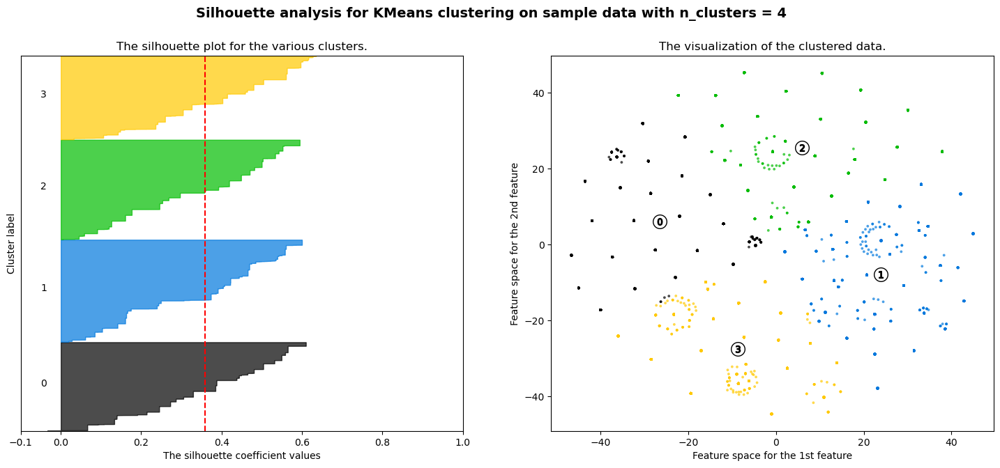

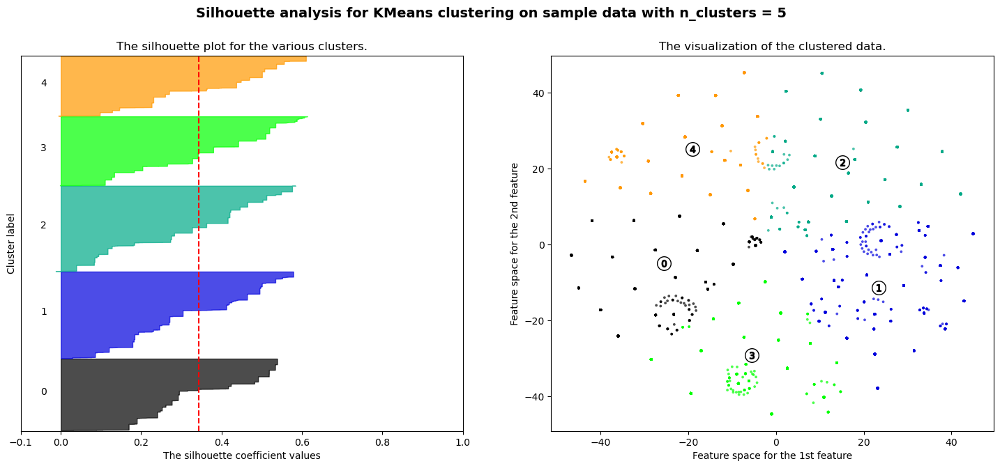

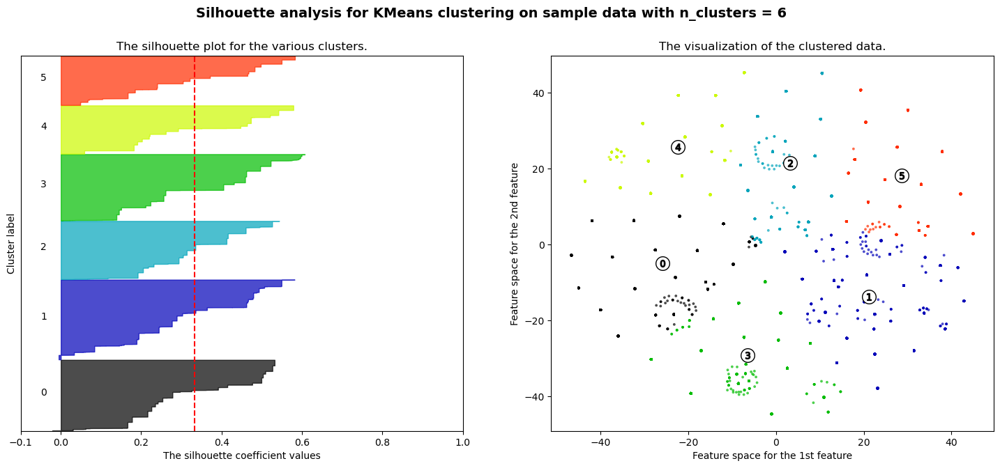

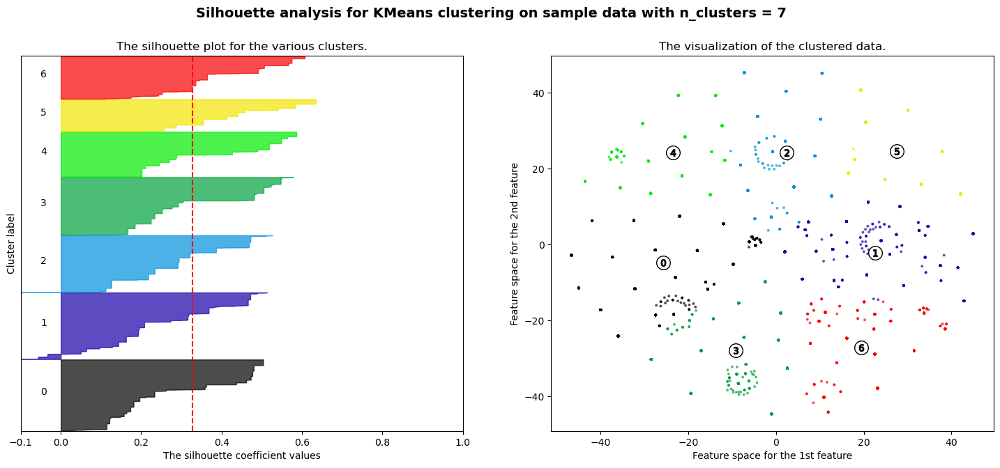

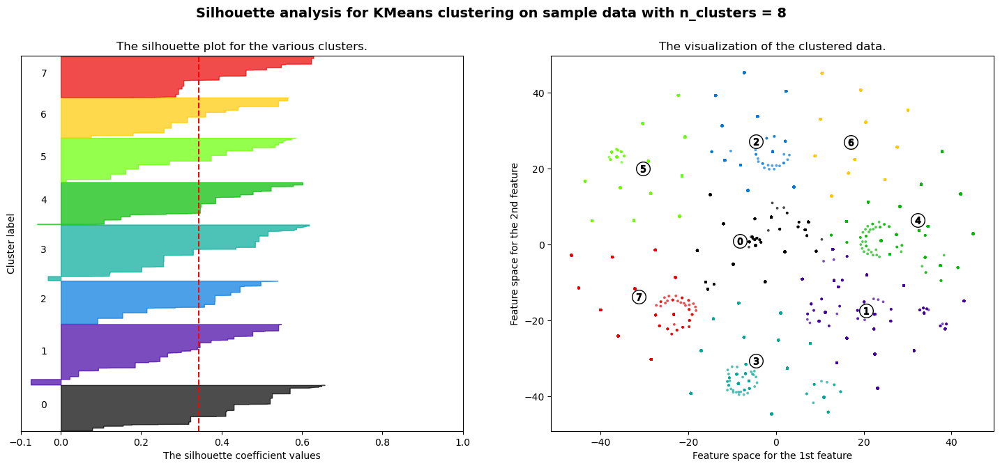

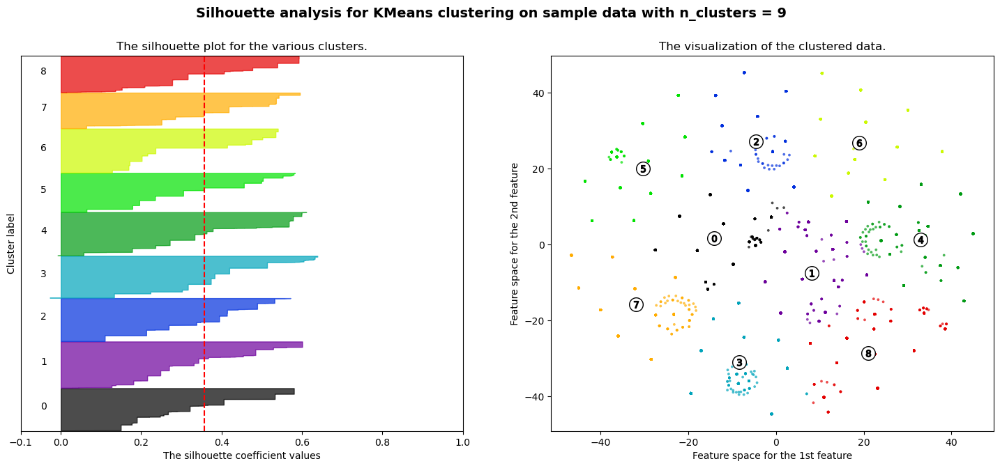

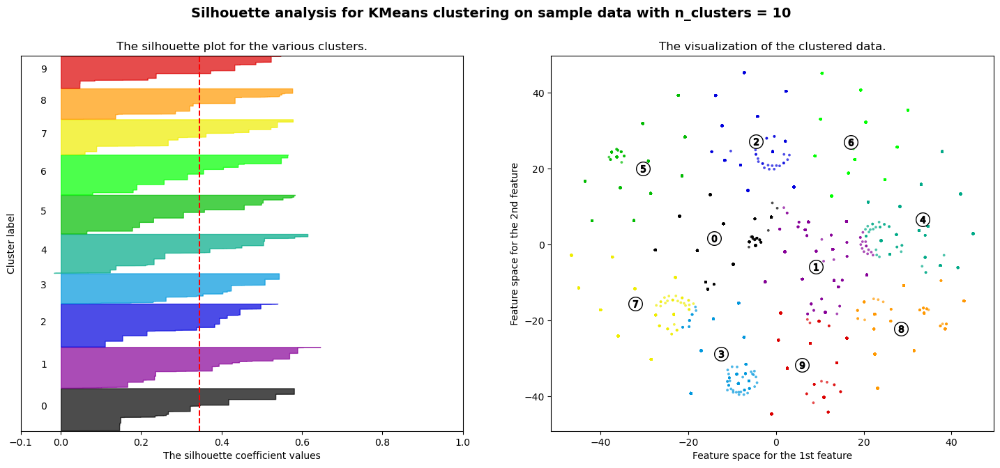

In [130]:
range_n_clusters = [2,3,4,5,6,7,8,9,10]

silhouette(X_embedded, data['level'], range_n_clusters)

In [176]:
X_embedded

array([[ 78.36314  , -82.8913   ],
       [-21.528177 , -97.84958  ],
       [ 79.94032  , -62.402912 ],
       ...,
       [ 23.4038   , -12.762214 ],
       [  2.4020596,  69.54782  ],
       [  2.41861  ,  -6.6944084]], dtype=float32)

C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_14212\2024021708.py:24: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



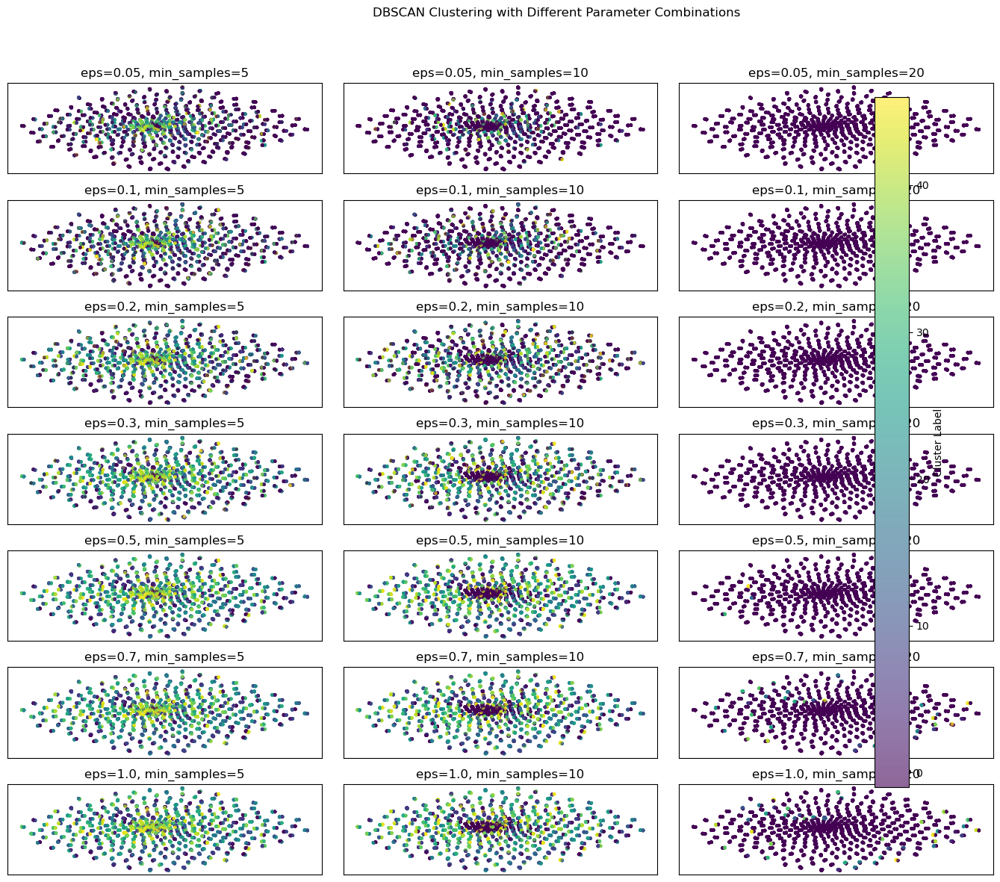

In [177]:
# Grid search parameters
eps_values = [0.05, 0.1, 0.2, 0.3, 0.5, 0.7, 1.0]     # Different values for epsilon
min_samples_values = [5, 10, 20]       # Different values for min_samples

fig, axes = plt.subplots(len(eps_values), len(min_samples_values), figsize=(15, 12), sharex=True, sharey=True)
fig.suptitle("DBSCAN Clustering with Different Parameter Combinations")

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        # Initialize and fit DBSCAN with the current parameters
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        clusters = dbscan.fit_predict(X_embedded)
        
        # Plot the resulting clusters in 2D t-SNE space
        ax = axes[i, j]
        scatter = ax.scatter(X_embedded[:, 0], X_embedded[:, 1], c=clusters, cmap='viridis', s=5, alpha=0.6)
        
        # Title for each subplot
        ax.set_title(f"eps={eps}, min_samples={min_samples}")
        ax.set_xticks([])
        ax.set_yticks([])

plt.colorbar(scatter, ax=axes, location="right", label="Cluster Label")
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='t-SNE1', y='t-SNE2', hue='winner_color', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [178]:
tsne_df['phase'] = player_info_columns['phase'].values

In [179]:
tsne_df

,t-SNE1,t-SNE2,level,winner_color,result,Area_winner_color,Territory_winner_color,phase
0,-18.567698,110.925438,1,white,score,B,W,starter
1,-97.371735,34.022087,1,white,score,B,W,starter
2,1.410144,110.457634,1,white,score,B,W,starter
3,87.285301,81.717659,1,white,score,B,W,starter
4,-108.508209,-54.640911,1,white,score,B,W,starter
...,...,...,...,...,...,...,...,...
9750,-38.442238,-46.621883,1,white,resign,B,B,final
9751,81.434006,-20.516649,1,white,resign,B,B,final
9752,3.775283,28.811157,1,white,resign,B,B,final
9753,63.868752,-50.990803,1,white,resign,B,B,final


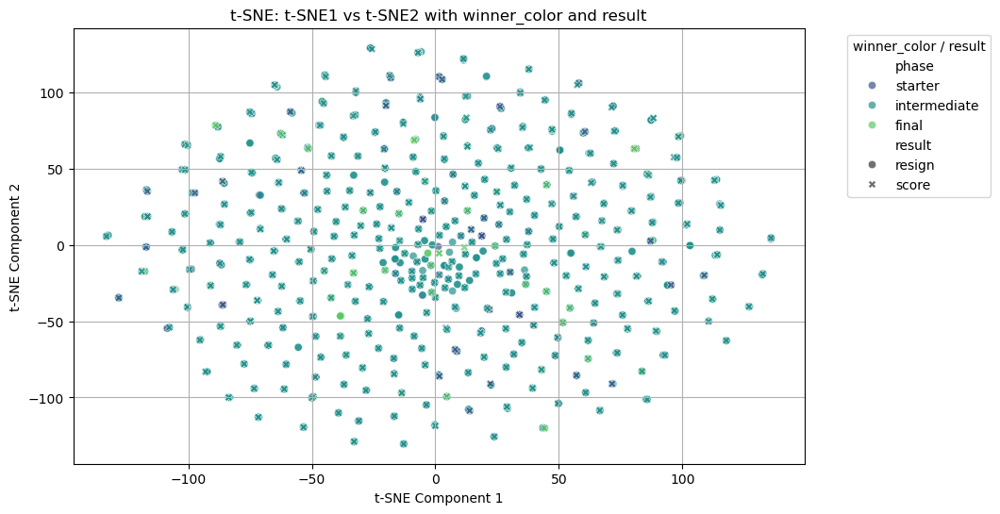

In [180]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df[tsne_df['level']==3], x='t-SNE1', y='t-SNE2', hue='phase', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [181]:
tsne_df[tsne_df['level']==3]

,t-SNE1,t-SNE2,level,winner_color,result,Area_winner_color,Territory_winner_color,phase
4749,-117.128471,-1.407707,3,white,resign,B,B,starter
4750,18.811092,5.897855,3,white,resign,B,B,starter
4751,-0.185420,83.442139,3,white,resign,B,B,starter
4752,26.627899,89.400658,3,white,resign,B,B,starter
4753,28.622952,-30.986340,3,white,resign,B,B,starter
...,...,...,...,...,...,...,...,...
9660,44.225906,-120.084206,3,black,score,B,B,final
9661,-88.910461,78.278923,3,black,score,B,B,final
9662,-33.139706,-18.438658,3,black,score,B,B,final
9663,-8.534048,68.680771,3,black,score,B,B,final


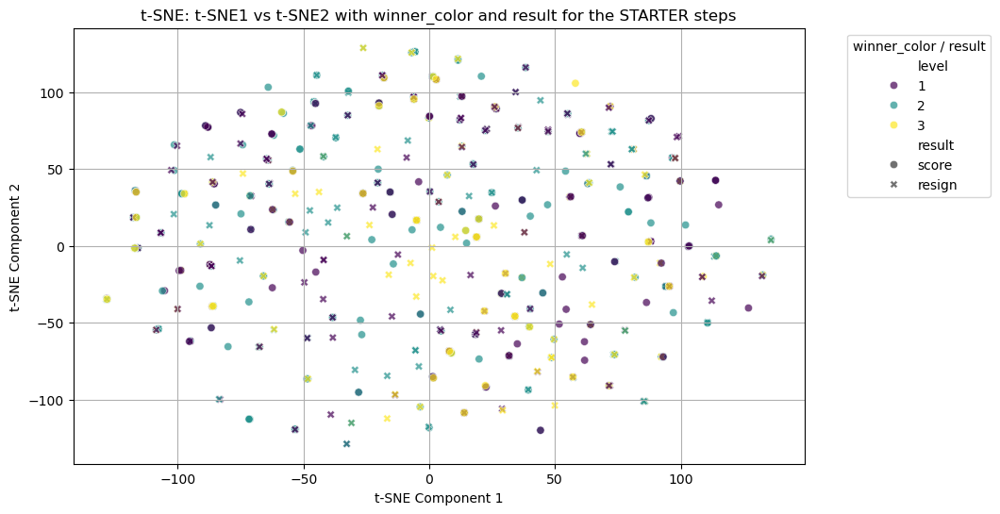

In [182]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df.query('phase == "starter"'), x='t-SNE1', y='t-SNE2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

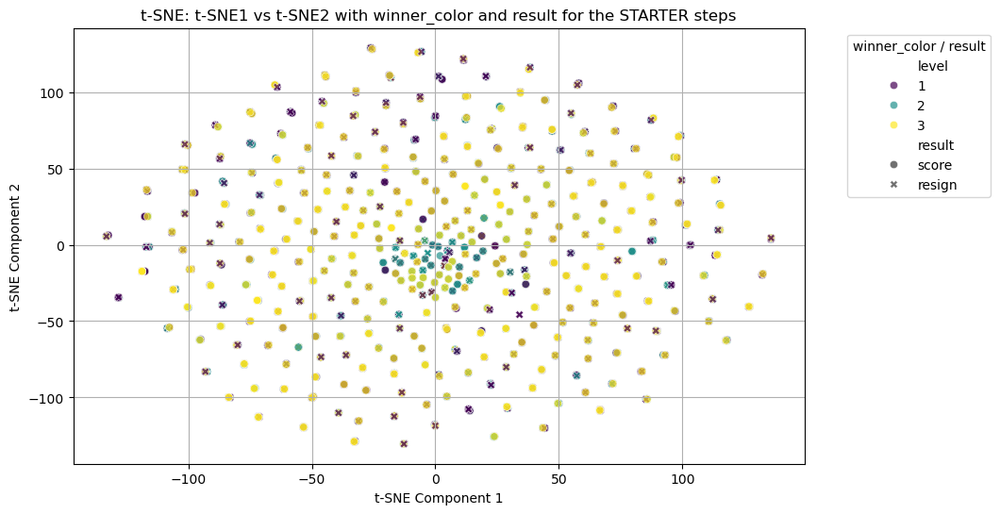

In [183]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df.query('phase == "intermediate"'), x='t-SNE1', y='t-SNE2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

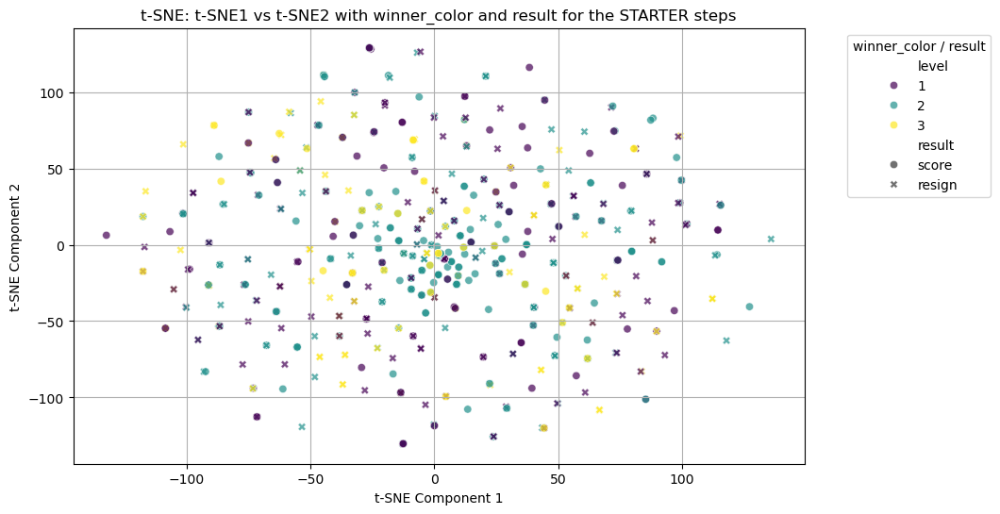

In [184]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df.query('phase == "final"'), x='t-SNE1', y='t-SNE2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [185]:
tsne_df.query('phase == "intermediate"')

,t-SNE1,t-SNE2,level,winner_color,result,Area_winner_color,Territory_winner_color,phase
20,26.087259,90.505089,1,white,score,B,W,intermediate
21,31.770247,-71.679008,1,white,score,B,W,intermediate
22,-95.007294,-61.982231,1,white,score,B,W,intermediate
23,-86.108597,41.590504,1,white,score,B,W,intermediate
24,12.287274,97.321594,1,white,score,B,W,intermediate
...,...,...,...,...,...,...,...,...
9735,-14.349228,2.734843,1,white,resign,B,B,intermediate
9736,-39.212200,-110.112556,1,white,resign,B,B,intermediate
9737,54.898777,86.323730,1,white,resign,B,B,intermediate
9738,30.907078,-31.451385,1,white,resign,B,B,intermediate


In [186]:
tsne_df.query('phase == "starter"')

,t-SNE1,t-SNE2,level,winner_color,result,Area_winner_color,Territory_winner_color,phase
0,-18.567698,110.925438,1,white,score,B,W,starter
1,-97.371735,34.022087,1,white,score,B,W,starter
2,1.410144,110.457634,1,white,score,B,W,starter
3,87.285301,81.717659,1,white,score,B,W,starter
4,-108.508209,-54.640911,1,white,score,B,W,starter
...,...,...,...,...,...,...,...,...
9680,-14.838309,-45.901585,1,white,resign,B,B,starter
9681,71.484589,-91.022125,1,white,resign,B,B,starter
9682,-41.994411,-9.100278,1,white,resign,B,B,starter
9683,-106.757568,8.592686,1,white,resign,B,B,starter


In [103]:
X_embedded

array([[-35.515045,  14.989881],
       [-29.110302,  22.023357],
       [-35.515045,  14.989881],
       ...,
       [ 37.484474, -21.440527],
       [ 34.374313, -16.90222 ],
       [ 37.484474, -21.440527]], dtype=float32)

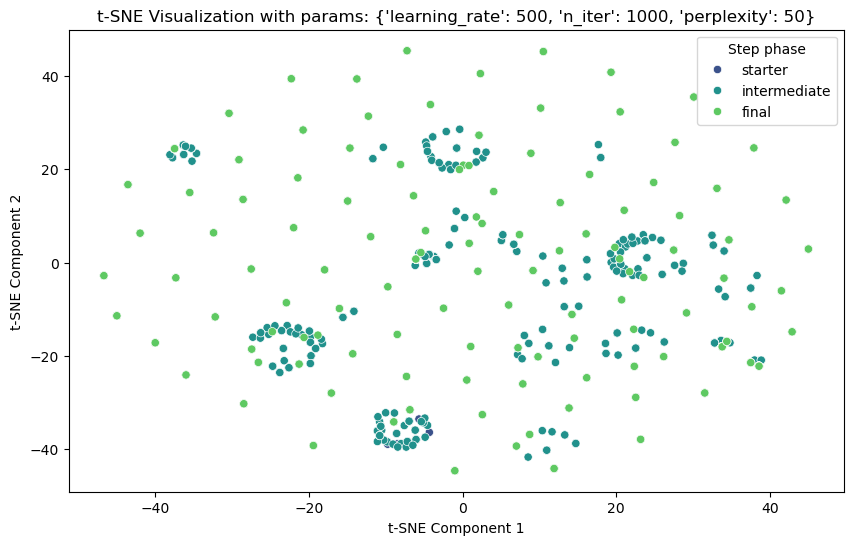

In [102]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1], hue=player_info_columns['phase'], palette='viridis')
plt.title(f't-SNE Visualization with params: {params}')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

In [92]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result,Player,phase
0,1,1,white,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5",FrayedKnot,starter
1,1,2,black,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5",FrayedKnot,starter
2,1,3,white,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5",FrayedKnot,starter
3,1,4,black,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5",FrayedKnot,starter
4,1,5,white,white,Time,score,Japanese,4,white,105,...,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5",FrayedKnot,starter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5",tmat,final
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5",tmat,final
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5",tmat,final
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5",tmat,final


In [101]:
X_embedded

array([[-35.515045,  14.989881],
       [-29.110302,  22.023357],
       [-35.515045,  14.989881],
       ...,
       [ 37.484474, -21.440527],
       [ 34.374313, -16.90222 ],
       [ 37.484474, -21.440527]], dtype=float32)

In [104]:


# Create a DataFrame for t-SNE components
tsne_df2 = pd.DataFrame(X_embedded, columns=['t-SNE1', 't-SNE2'])
tsne_df2['level'] = player_info_columns['level'].values
tsne_df2['winner_color'] = player_info_columns['winner_color'].values
tsne_df2['result'] = player_info_columns['result'].values
tsne_df2['Area_winner_color'] = player_info_columns['Area_winner_color'].values
tsne_df2['Territory_winner_color'] = player_info_columns['Territory_winner_color'].values
tsne_df2['phase'] = player_info_columns['phase'].values
tsne_df2['player'] = player_info_columns['Player'].values





In [105]:
tsne_df2

,t-SNE1,t-SNE2,level,winner_color,result,Area_winner_color,Territory_winner_color,phase,player
0,-35.515045,14.989881,1,white,score,B,W,starter,FrayedKnot
1,-29.110302,22.023357,1,white,score,B,W,starter,FrayedKnot
2,-35.515045,14.989881,1,white,score,B,W,starter,FrayedKnot
3,-29.110302,22.023357,1,white,score,B,W,starter,FrayedKnot
4,-35.515045,14.989881,1,white,score,B,W,starter,FrayedKnot
...,...,...,...,...,...,...,...,...,...
9750,38.564819,-22.205763,1,white,resign,B,B,final,tmat
9751,34.374092,-16.902079,1,white,resign,B,B,final,tmat
9752,37.484474,-21.440527,1,white,resign,B,B,final,tmat
9753,34.374313,-16.902220,1,white,resign,B,B,final,tmat


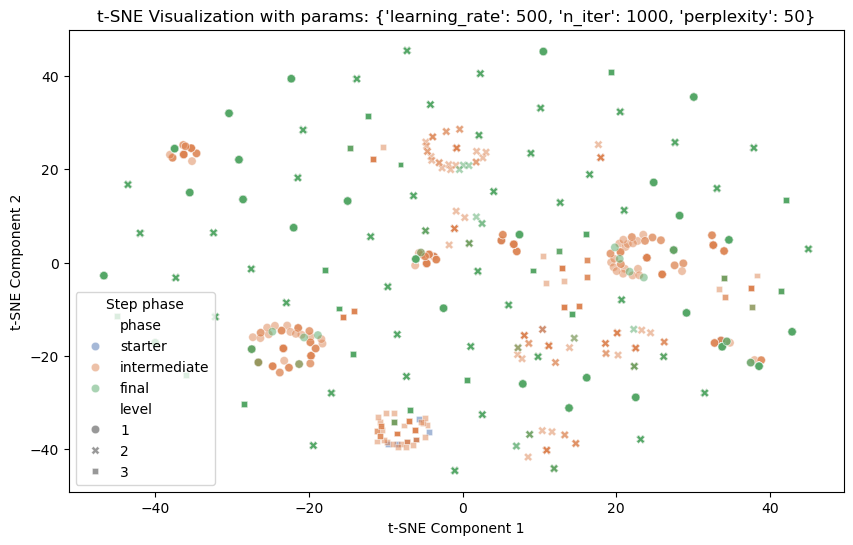

In [123]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_df2.iloc[:, 0], y=tsne_df2.iloc[:, 1], hue=player_info_columns['phase'], style=player_info_columns['level'], palette='deep', alpha=0.5)
plt.title(f't-SNE Visualization with params: {params}')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

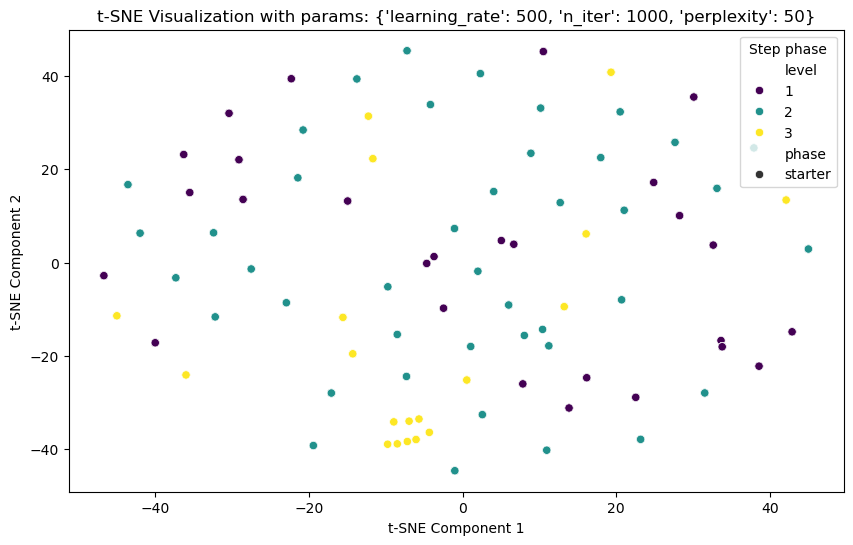

In [116]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df2.query('phase == "starter" & player != "mangochia"') ,x='t-SNE1', y='t-SNE2', hue='level', style='phase', palette='viridis')
plt.title(f't-SNE Visualization with params: {params}')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

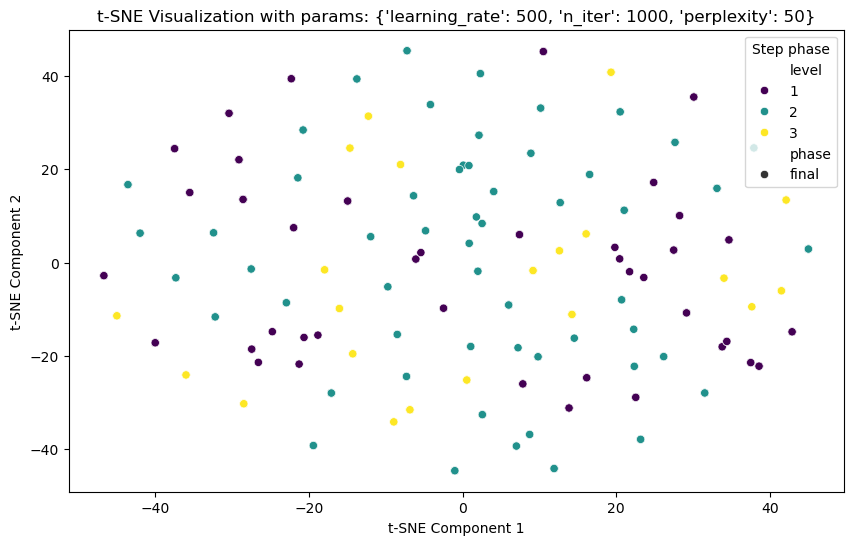

In [114]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df2.query('phase == "final"') ,x='t-SNE1', y='t-SNE2', hue='level', style='phase', palette='viridis')
plt.title(f't-SNE Visualization with params: {params}')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

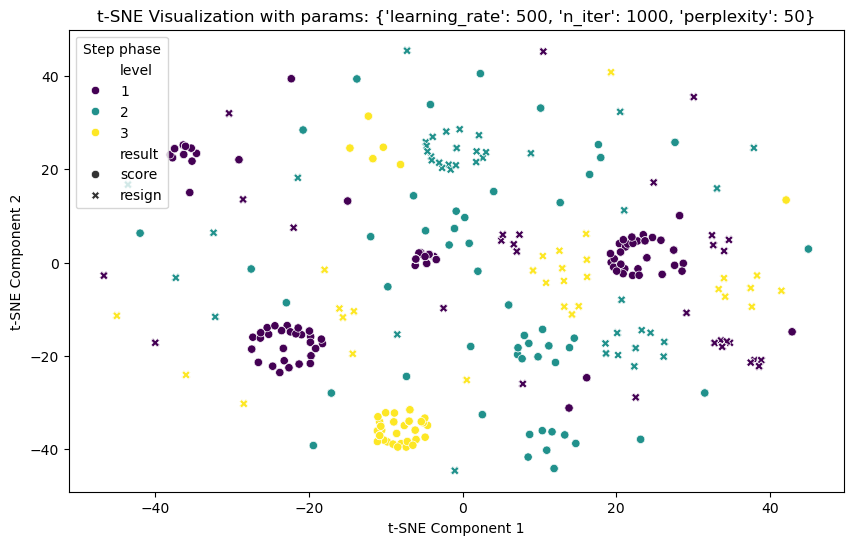

In [120]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df2.query('phase == "intermediate"') ,x='t-SNE1', y='t-SNE2', hue='level', style='result', palette='viridis')
plt.title(f't-SNE Visualization with params: {params}')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

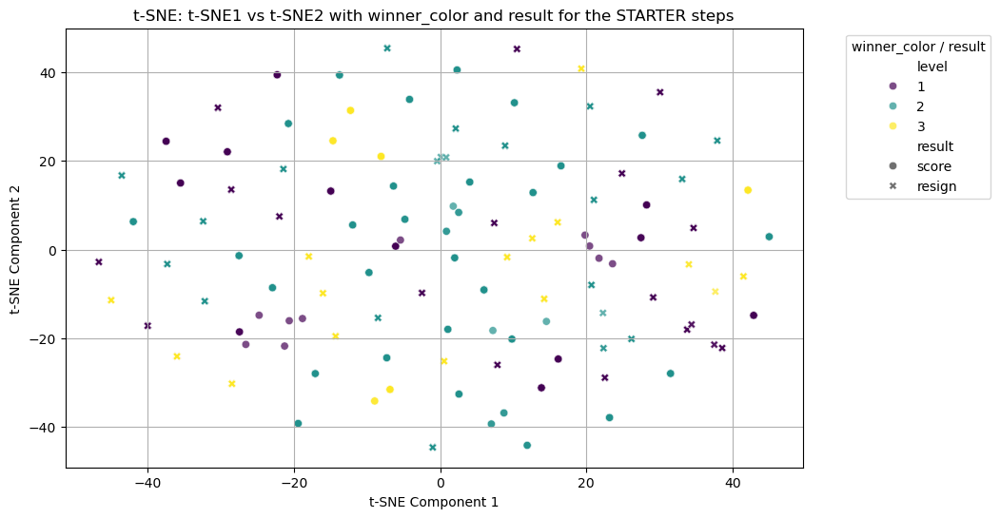

In [124]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df2.query('phase == "final"'), x='t-SNE1', y='t-SNE2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

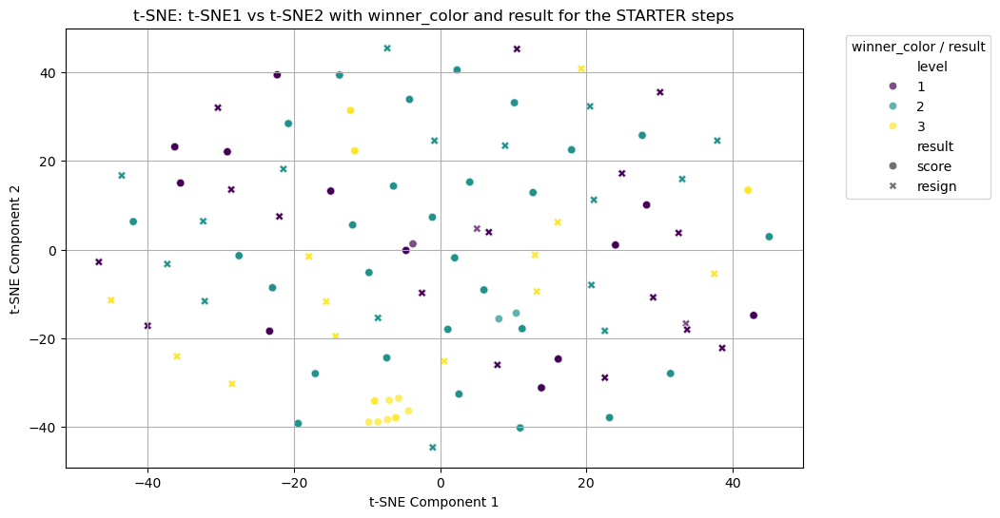

In [125]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df2.query('phase == "starter"'), x='t-SNE1', y='t-SNE2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [96]:
fig = px.scatter_3d(tsne_df2.query('phase == "starter" & player != "mangochia"'), x=tsne_df2.iloc[:,0], y=tsne_df2.iloc[:,1], z=tsne_df2.iloc[:,2],
              color=tsne_df2['level'])
fig.show()

In [100]:
fig = px.scatter_3d(tsne_df2.query('level == 1 & player != "mangochia"'), x=tsne_df2.iloc[:,0], y=tsne_df2.iloc[:,1], z=tsne_df2.iloc[:,2],
              color=tsne_df2['phase'], opacity= 0.4)
fig.show()